In [1]:
from google.colab import drive
drive.mount('/content/drive/')

import numpy as np
import os
import cv2
from sklearn.model_selection import train_test_split
#from tensorflow.keras.layers import Input
#from tensorflow.keras.models import Model
import tensorflow.keras as keras
from tensorflow.keras import layers
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.metrics import MeanSquaredError


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
def load_images(folder_path):
    image_list = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg"):
            img = cv2.imread(os.path.join(folder_path, filename))
            img = cv2.resize(img, (64,64), interpolation = cv2.INTER_AREA)
            img = img[:,:,::-1]
            img_array = np.array(img) / 255.0
            image_list.append(img_array)
    return np.array(image_list)

folder_path = "/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/data/animefaces256cleaner"
x_data = load_images(folder_path)

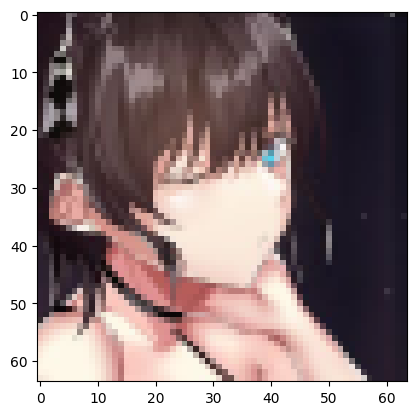

In [4]:
x_data = x_data[:1500]
plt.imshow(x_data[98])

In [5]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense, Reshape, Conv2DTranspose, Lambda, Flatten
from tensorflow.keras.models import Sequential
import numpy as np

LATENT_DIM = 256  # Dimensionality of the latent space
IMAGE_SIZE = 64

# Encoder
encoder_input = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_input)
x = Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2D(256, 3, activation="relu", strides=2, padding="same")(x)
x = Flatten()(x)
x = Dense(512, activation="relu")(x)

z_mean = Dense(LATENT_DIM, name="z_mean")(x)
z_log_var = Dense(LATENT_DIM, name="z_log_var")(x)

# Sampling function
def sampling(args):
    z_mean, z_log_var = args
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], LATENT_DIM))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

z = Lambda(sampling, output_shape=(LATENT_DIM,), name="z")([z_mean, z_log_var])

encoder = Model(encoder_input, [z_mean, z_log_var, z], name="encoder")

# Decoder
decoder_input = Input(shape=(LATENT_DIM,))
x = Dense(512, activation="relu")(decoder_input)
x = Dense(8 * 8 * 256, activation="relu")(x)
x = Reshape((8, 8, 256))(x)
x = Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_output = Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)

decoder = Model(decoder_input, decoder_output, name="decoder")

# VAE
vae_output = decoder(encoder(encoder_input)[2])
vae = Model(encoder_input, vae_output, name="vae")

print(encoder.summary())
print(decoder.summary())
print(vae.summary())

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 16, 16, 64)   18496       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_2 (Conv2D)              (None, 8, 8, 128)    73856       ['conv2d_1[0][0]']               
                                                                                            

In [6]:
# Loss
reconstruction_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(encoder_input, vae_output))
reconstruction_loss *= IMAGE_SIZE * IMAGE_SIZE
kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=-1)
vae_loss = tf.reduce_mean(reconstruction_loss + kl_loss)

# Compile
vae.add_loss(vae_loss)

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=10000,
    decay_rate=0.97)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule)
vae.compile(optimizer = optimizer)

In [7]:
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import Callback

class PlotReconstructedImages(Callback):
    def __init__(self, x_val, interval=20):
        super().__init__()
        self.x_val = x_val
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            reconstructed_images = self.model.predict(self.x_val)
            self.plot_images(reconstructed_images)

    def plot_images(self, reconstructed_images):
        n = 10
        plt.figure(figsize=(20, 4))

        for i in range(n):
            # Display original images
            ax = plt.subplot(2, n, i + 1)
            plt.imshow(self.x_val[i].reshape(IMAGE_SIZE, IMAGE_SIZE, 3), cmap='gray')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(2, n, i + 1 + n)
            plt.imshow(reconstructed_images[i].reshape(IMAGE_SIZE, IMAGE_SIZE, 3), cmap='gray')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()

plot_callback = PlotReconstructedImages(x_data, interval=20)

Epoch 1/500
6/6 [==============================] - 17s 378ms/step - loss: 2789.3088
Epoch 2/500
6/6 [==============================] - 1s 90ms/step - loss: 2647.3347
Epoch 3/500
6/6 [==============================] - 1s 89ms/step - loss: 2626.1506
Epoch 4/500
6/6 [==============================] - 1s 89ms/step - loss: 2613.6697
Epoch 5/500
6/6 [==============================] - 1s 90ms/step - loss: 2595.9519
Epoch 6/500
6/6 [==============================] - 1s 91ms/step - loss: 2569.4163
Epoch 7/500
6/6 [==============================] - 1s 90ms/step - loss: 2545.1047
Epoch 8/500
6/6 [==============================] - 1s 90ms/step - loss: 2527.3665
Epoch 9/500
6/6 [==============================] - 1s 89ms/step - loss: 2515.2295
Epoch 10/500
6/6 [==============================] - 1s 90ms/step - loss: 2511.2217
Epoch 11/500
6/6 [==============================] - 1s 90ms/step - loss: 2501.4988
Epoch 12/500
6/6 [==============================] - 1s 90ms/step - loss: 2494.5806
Epoch 13/50

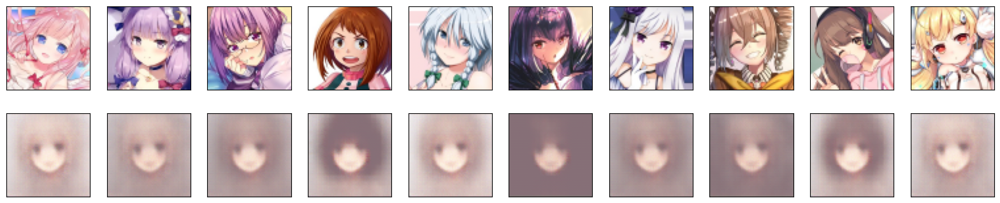

6/6 [==============================] - 3s 511ms/step - loss: 2459.4180
Epoch 21/500
6/6 [==============================] - 1s 91ms/step - loss: 2453.8972
Epoch 22/500
6/6 [==============================] - 1s 91ms/step - loss: 2440.5315
Epoch 23/500
6/6 [==============================] - 1s 91ms/step - loss: 2432.1533
Epoch 24/500
6/6 [==============================] - 1s 91ms/step - loss: 2417.8704
Epoch 25/500
6/6 [==============================] - 1s 91ms/step - loss: 2407.9973
Epoch 26/500
6/6 [==============================] - 1s 90ms/step - loss: 2399.7749
Epoch 27/500
6/6 [==============================] - 1s 91ms/step - loss: 2413.3176
Epoch 28/500
6/6 [==============================] - 1s 90ms/step - loss: 2396.4016
Epoch 29/500
6/6 [==============================] - 1s 91ms/step - loss: 2387.6260
Epoch 30/500
6/6 [==============================] - 1s 91ms/step - loss: 2384.1553
Epoch 31/500
6/6 [==============================] - 1s 91ms/step - loss: 2377.0625
Epoch 32/500
6/6

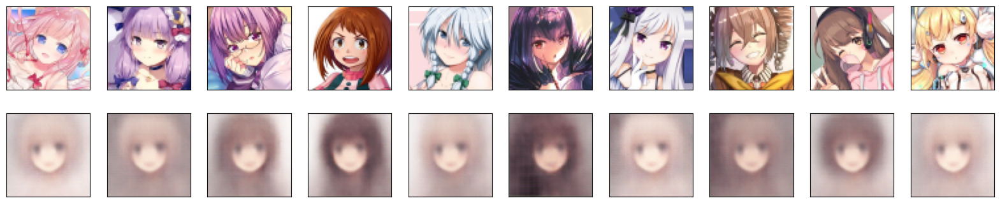

6/6 [==============================] - 2s 320ms/step - loss: 2368.1147
Epoch 41/500
6/6 [==============================] - 1s 93ms/step - loss: 2365.7410
Epoch 42/500
6/6 [==============================] - 1s 91ms/step - loss: 2368.7893
Epoch 43/500
6/6 [==============================] - 1s 92ms/step - loss: 2366.0007
Epoch 44/500
6/6 [==============================] - 1s 93ms/step - loss: 2361.9609
Epoch 45/500
6/6 [==============================] - 1s 91ms/step - loss: 2360.8464
Epoch 46/500
6/6 [==============================] - 1s 92ms/step - loss: 2357.8694
Epoch 47/500
6/6 [==============================] - 1s 92ms/step - loss: 2357.7666
Epoch 48/500
6/6 [==============================] - 1s 92ms/step - loss: 2354.2654
Epoch 49/500
6/6 [==============================] - 1s 92ms/step - loss: 2355.3594
Epoch 50/500
6/6 [==============================] - 1s 93ms/step - loss: 2353.5574
Epoch 51/500
6/6 [==============================] - 1s 92ms/step - loss: 2356.0962
Epoch 52/500
6/6

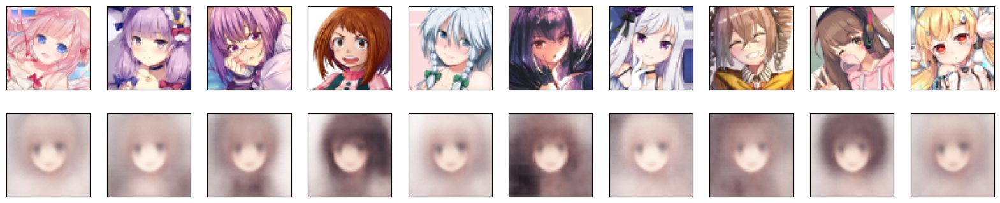

6/6 [==============================] - 2s 318ms/step - loss: 2342.1462
Epoch 61/500
6/6 [==============================] - 1s 92ms/step - loss: 2340.1851
Epoch 62/500
6/6 [==============================] - 1s 93ms/step - loss: 2341.3997
Epoch 63/500
6/6 [==============================] - 1s 93ms/step - loss: 2340.3987
Epoch 64/500
6/6 [==============================] - 1s 94ms/step - loss: 2338.6646
Epoch 65/500
6/6 [==============================] - 1s 93ms/step - loss: 2334.7219
Epoch 66/500
6/6 [==============================] - 1s 93ms/step - loss: 2332.8179
Epoch 67/500
6/6 [==============================] - 1s 93ms/step - loss: 2330.7590
Epoch 68/500
6/6 [==============================] - 1s 93ms/step - loss: 2329.9941
Epoch 69/500
6/6 [==============================] - 1s 93ms/step - loss: 2327.0657
Epoch 70/500
6/6 [==============================] - 1s 93ms/step - loss: 2328.5664
Epoch 71/500
6/6 [==============================] - 1s 93ms/step - loss: 2326.7136
Epoch 72/500
6/6

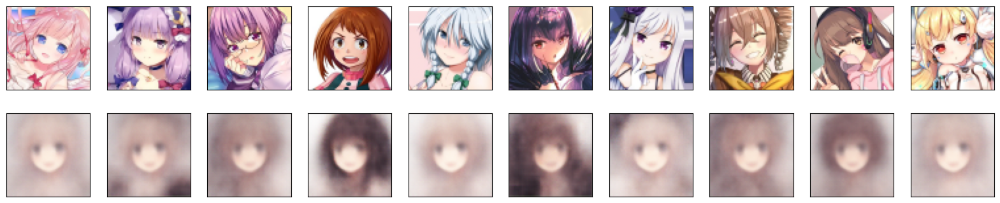

6/6 [==============================] - 2s 365ms/step - loss: 2315.3242
Epoch 81/500
6/6 [==============================] - 1s 94ms/step - loss: 2314.9536
Epoch 82/500
6/6 [==============================] - 1s 94ms/step - loss: 2315.5334
Epoch 83/500
6/6 [==============================] - 1s 94ms/step - loss: 2313.5608
Epoch 84/500
6/6 [==============================] - 1s 95ms/step - loss: 2311.9734
Epoch 85/500
6/6 [==============================] - 1s 94ms/step - loss: 2311.0188
Epoch 86/500
6/6 [==============================] - 1s 95ms/step - loss: 2308.4368
Epoch 87/500
6/6 [==============================] - 1s 93ms/step - loss: 2312.5076
Epoch 88/500
6/6 [==============================] - 1s 94ms/step - loss: 2308.3704
Epoch 89/500
6/6 [==============================] - 1s 94ms/step - loss: 2305.5652
Epoch 90/500
6/6 [==============================] - 1s 94ms/step - loss: 2305.4221
Epoch 91/500
6/6 [==============================] - 1s 95ms/step - loss: 2303.1455
Epoch 92/500
6/6

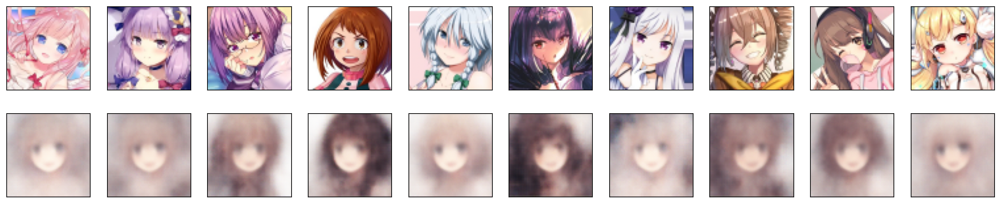

6/6 [==============================] - 2s 326ms/step - loss: 2296.3032
Epoch 101/500
6/6 [==============================] - 1s 95ms/step - loss: 2293.0300
Epoch 102/500
6/6 [==============================] - 1s 96ms/step - loss: 2291.6296
Epoch 103/500
6/6 [==============================] - 1s 95ms/step - loss: 2290.5076
Epoch 104/500
6/6 [==============================] - 1s 96ms/step - loss: 2291.7766
Epoch 105/500
6/6 [==============================] - 1s 96ms/step - loss: 2292.9089
Epoch 106/500
6/6 [==============================] - 1s 95ms/step - loss: 2289.5635
Epoch 107/500
6/6 [==============================] - 1s 95ms/step - loss: 2286.7424
Epoch 108/500
6/6 [==============================] - 1s 95ms/step - loss: 2287.4014
Epoch 109/500
6/6 [==============================] - 1s 96ms/step - loss: 2286.8938
Epoch 110/500
6/6 [==============================] - 1s 95ms/step - loss: 2284.7566
Epoch 111/500
6/6 [==============================] - 1s 96ms/step - loss: 2283.0129
Epoch

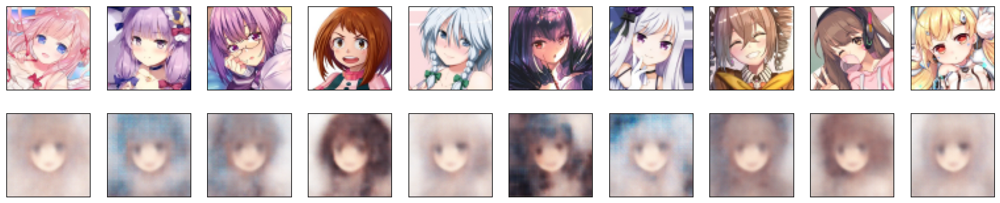

6/6 [==============================] - 2s 325ms/step - loss: 2292.1831
Epoch 121/500
6/6 [==============================] - 1s 96ms/step - loss: 2279.0022
Epoch 122/500
6/6 [==============================] - 1s 99ms/step - loss: 2272.2000
Epoch 123/500
6/6 [==============================] - 1s 96ms/step - loss: 2267.4431
Epoch 124/500
6/6 [==============================] - 1s 96ms/step - loss: 2265.1663
Epoch 125/500
6/6 [==============================] - 1s 96ms/step - loss: 2265.9280
Epoch 126/500
6/6 [==============================] - 1s 96ms/step - loss: 2262.2546
Epoch 127/500
6/6 [==============================] - 1s 96ms/step - loss: 2261.6238
Epoch 128/500
6/6 [==============================] - 1s 96ms/step - loss: 2259.0286
Epoch 129/500
6/6 [==============================] - 1s 97ms/step - loss: 2256.2131
Epoch 130/500
6/6 [==============================] - 1s 97ms/step - loss: 2252.4434
Epoch 131/500
6/6 [==============================] - 1s 98ms/step - loss: 2251.7595
Epoch

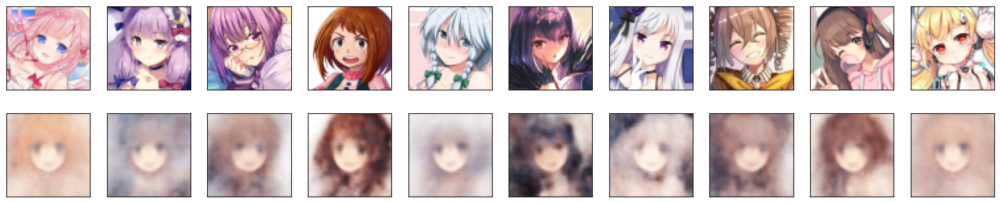

6/6 [==============================] - 2s 372ms/step - loss: 2242.9924
Epoch 141/500
6/6 [==============================] - 1s 96ms/step - loss: 2240.9485
Epoch 142/500
6/6 [==============================] - 1s 99ms/step - loss: 2239.3416
Epoch 143/500
6/6 [==============================] - 1s 97ms/step - loss: 2238.9128
Epoch 144/500
6/6 [==============================] - 1s 98ms/step - loss: 2236.4739
Epoch 145/500
6/6 [==============================] - 1s 97ms/step - loss: 2235.7388
Epoch 146/500
6/6 [==============================] - 1s 98ms/step - loss: 2237.1331
Epoch 147/500
6/6 [==============================] - 1s 98ms/step - loss: 2234.4819
Epoch 148/500
6/6 [==============================] - 1s 98ms/step - loss: 2232.3113
Epoch 149/500
6/6 [==============================] - 1s 98ms/step - loss: 2231.4404
Epoch 150/500
6/6 [==============================] - 1s 97ms/step - loss: 2234.9417
Epoch 151/500
6/6 [==============================] - 1s 97ms/step - loss: 2240.5496
Epoch

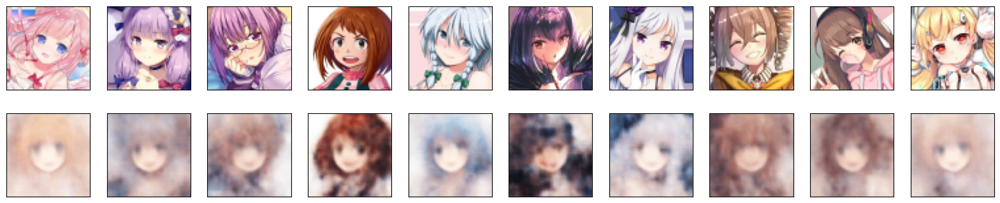

6/6 [==============================] - 2s 321ms/step - loss: 2218.5024
Epoch 161/500
6/6 [==============================] - 1s 96ms/step - loss: 2216.9470
Epoch 162/500
6/6 [==============================] - 1s 97ms/step - loss: 2215.9077
Epoch 163/500
6/6 [==============================] - 1s 96ms/step - loss: 2223.7463
Epoch 164/500
6/6 [==============================] - 1s 98ms/step - loss: 2219.7515
Epoch 165/500
6/6 [==============================] - 1s 96ms/step - loss: 2215.6194
Epoch 166/500
6/6 [==============================] - 1s 97ms/step - loss: 2215.4387
Epoch 167/500
6/6 [==============================] - 1s 96ms/step - loss: 2214.0979
Epoch 168/500
6/6 [==============================] - 1s 97ms/step - loss: 2213.4446
Epoch 169/500
6/6 [==============================] - 1s 96ms/step - loss: 2208.7654
Epoch 170/500
6/6 [==============================] - 1s 96ms/step - loss: 2207.6794
Epoch 171/500
6/6 [==============================] - 1s 96ms/step - loss: 2209.0139
Epoch

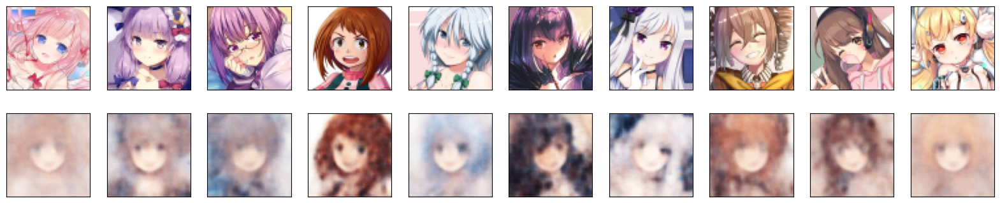

6/6 [==============================] - 2s 321ms/step - loss: 2197.1113
Epoch 181/500
6/6 [==============================] - 1s 95ms/step - loss: 2197.7261
Epoch 182/500
6/6 [==============================] - 1s 97ms/step - loss: 2201.1309
Epoch 183/500
6/6 [==============================] - 1s 96ms/step - loss: 2196.3142
Epoch 184/500
6/6 [==============================] - 1s 97ms/step - loss: 2195.4900
Epoch 185/500
6/6 [==============================] - 1s 96ms/step - loss: 2197.5303
Epoch 186/500
6/6 [==============================] - 1s 96ms/step - loss: 2193.6375
Epoch 187/500
6/6 [==============================] - 1s 96ms/step - loss: 2192.8450
Epoch 188/500
6/6 [==============================] - 1s 95ms/step - loss: 2191.8076
Epoch 189/500
6/6 [==============================] - 1s 96ms/step - loss: 2189.5247
Epoch 190/500
6/6 [==============================] - 1s 95ms/step - loss: 2187.6592
Epoch 191/500
6/6 [==============================] - 1s 96ms/step - loss: 2187.3167
Epoch

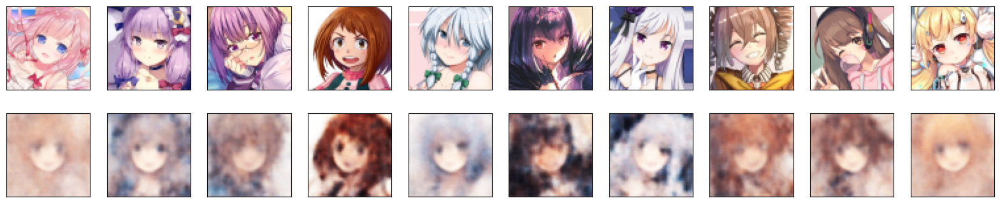

6/6 [==============================] - 2s 377ms/step - loss: 2180.1174
Epoch 201/500
6/6 [==============================] - 1s 96ms/step - loss: 2181.3176
Epoch 202/500
6/6 [==============================] - 1s 97ms/step - loss: 2176.1006
Epoch 203/500
6/6 [==============================] - 1s 95ms/step - loss: 2174.6011
Epoch 204/500
6/6 [==============================] - 1s 97ms/step - loss: 2172.2197
Epoch 205/500
6/6 [==============================] - 1s 96ms/step - loss: 2177.3435
Epoch 206/500
6/6 [==============================] - 1s 96ms/step - loss: 2177.5400
Epoch 207/500
6/6 [==============================] - 1s 95ms/step - loss: 2174.7603
Epoch 208/500
6/6 [==============================] - 1s 95ms/step - loss: 2174.1267
Epoch 209/500
6/6 [==============================] - 1s 95ms/step - loss: 2169.9199
Epoch 210/500
6/6 [==============================] - 1s 96ms/step - loss: 2168.1787
Epoch 211/500
6/6 [==============================] - 1s 95ms/step - loss: 2169.3318
Epoch

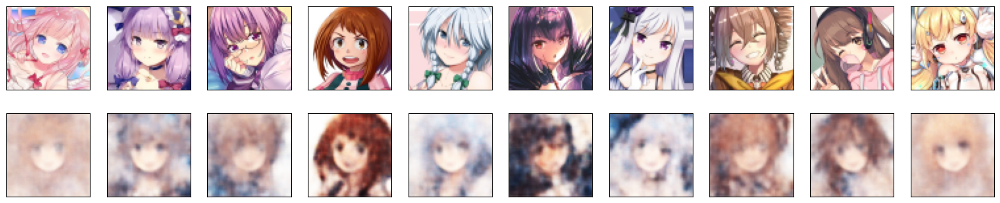

6/6 [==============================] - 2s 334ms/step - loss: 2159.3525
Epoch 221/500
6/6 [==============================] - 1s 95ms/step - loss: 2161.0525
Epoch 222/500
6/6 [==============================] - 1s 96ms/step - loss: 2160.3394
Epoch 223/500
6/6 [==============================] - 1s 96ms/step - loss: 2156.7634
Epoch 224/500
6/6 [==============================] - 1s 96ms/step - loss: 2156.4924
Epoch 225/500
6/6 [==============================] - 1s 96ms/step - loss: 2158.0222
Epoch 226/500
6/6 [==============================] - 1s 95ms/step - loss: 2157.0586
Epoch 227/500
6/6 [==============================] - 1s 95ms/step - loss: 2158.5779
Epoch 228/500
6/6 [==============================] - 1s 95ms/step - loss: 2154.3330
Epoch 229/500
6/6 [==============================] - 1s 96ms/step - loss: 2152.8101
Epoch 230/500
6/6 [==============================] - 1s 95ms/step - loss: 2151.1436
Epoch 231/500
6/6 [==============================] - 1s 95ms/step - loss: 2151.4495
Epoch

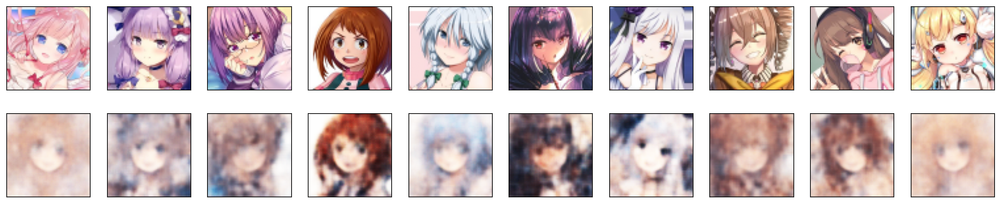

6/6 [==============================] - 2s 327ms/step - loss: 2147.5930
Epoch 241/500
6/6 [==============================] - 1s 96ms/step - loss: 2147.3440
Epoch 242/500
6/6 [==============================] - 1s 96ms/step - loss: 2151.1560
Epoch 243/500
6/6 [==============================] - 1s 94ms/step - loss: 2148.1467
Epoch 244/500
6/6 [==============================] - 1s 96ms/step - loss: 2146.1750
Epoch 245/500
6/6 [==============================] - 1s 96ms/step - loss: 2145.5618
Epoch 246/500
6/6 [==============================] - 1s 95ms/step - loss: 2143.8416
Epoch 247/500
6/6 [==============================] - 1s 96ms/step - loss: 2147.1135
Epoch 248/500
6/6 [==============================] - 1s 95ms/step - loss: 2142.8518
Epoch 249/500
6/6 [==============================] - 1s 97ms/step - loss: 2140.6599
Epoch 250/500
6/6 [==============================] - 1s 96ms/step - loss: 2139.9031
Epoch 251/500
6/6 [==============================] - 1s 96ms/step - loss: 2137.4915
Epoch

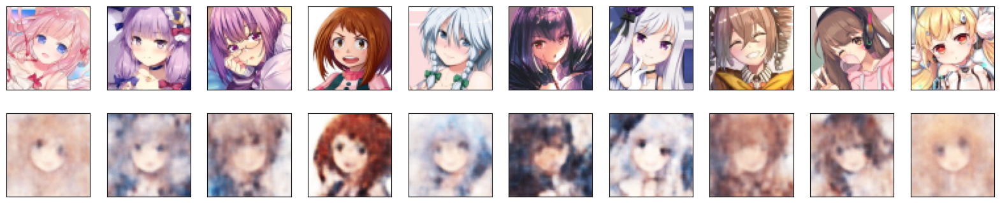

6/6 [==============================] - 2s 329ms/step - loss: 2131.9429
Epoch 261/500
6/6 [==============================] - 1s 97ms/step - loss: 2130.9612
Epoch 262/500
6/6 [==============================] - 1s 97ms/step - loss: 2130.8979
Epoch 263/500
6/6 [==============================] - 1s 96ms/step - loss: 2130.3928
Epoch 264/500
6/6 [==============================] - 1s 96ms/step - loss: 2133.5134
Epoch 265/500
6/6 [==============================] - 1s 96ms/step - loss: 2133.4944
Epoch 266/500
6/6 [==============================] - 1s 97ms/step - loss: 2128.5808
Epoch 267/500
6/6 [==============================] - 1s 96ms/step - loss: 2127.0881
Epoch 268/500
6/6 [==============================] - 1s 97ms/step - loss: 2126.9744
Epoch 269/500
6/6 [==============================] - 1s 96ms/step - loss: 2130.1882
Epoch 270/500
6/6 [==============================] - 1s 97ms/step - loss: 2131.2717
Epoch 271/500
6/6 [==============================] - 1s 96ms/step - loss: 2127.6428
Epoch

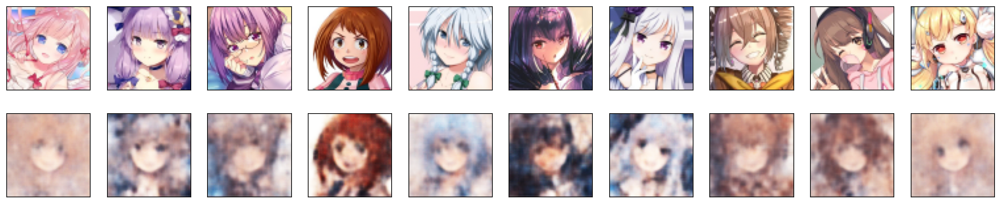

6/6 [==============================] - 2s 411ms/step - loss: 2121.6145
Epoch 281/500
6/6 [==============================] - 1s 96ms/step - loss: 2124.8516
Epoch 282/500
6/6 [==============================] - 1s 98ms/step - loss: 2129.4778
Epoch 283/500
6/6 [==============================] - 1s 96ms/step - loss: 2133.8953
Epoch 284/500
6/6 [==============================] - 1s 95ms/step - loss: 2129.2747
Epoch 285/500
6/6 [==============================] - 1s 97ms/step - loss: 2123.3621
Epoch 286/500
6/6 [==============================] - 1s 97ms/step - loss: 2119.1355
Epoch 287/500
6/6 [==============================] - 1s 96ms/step - loss: 2116.9014
Epoch 288/500
6/6 [==============================] - 1s 97ms/step - loss: 2114.5637
Epoch 289/500
6/6 [==============================] - 1s 96ms/step - loss: 2114.1526
Epoch 290/500
6/6 [==============================] - 1s 97ms/step - loss: 2113.9094
Epoch 291/500
6/6 [==============================] - 1s 97ms/step - loss: 2113.5286
Epoch

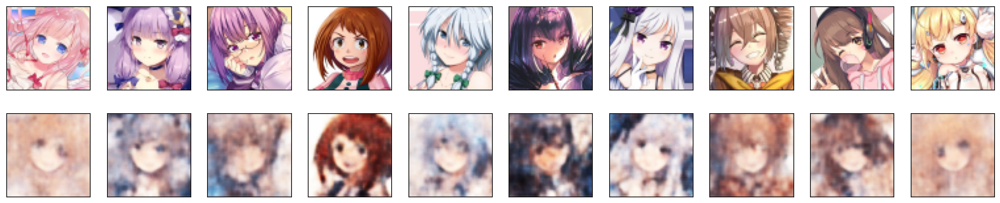

6/6 [==============================] - 2s 334ms/step - loss: 2108.6726
Epoch 301/500
6/6 [==============================] - 1s 97ms/step - loss: 2111.3044
Epoch 302/500
6/6 [==============================] - 1s 97ms/step - loss: 2112.0178
Epoch 303/500
6/6 [==============================] - 1s 95ms/step - loss: 2109.2932
Epoch 304/500
6/6 [==============================] - 1s 97ms/step - loss: 2108.2004
Epoch 305/500
6/6 [==============================] - 1s 95ms/step - loss: 2107.9705
Epoch 306/500
6/6 [==============================] - 1s 96ms/step - loss: 2107.7585
Epoch 307/500
6/6 [==============================] - 1s 97ms/step - loss: 2105.8398
Epoch 308/500
6/6 [==============================] - 1s 96ms/step - loss: 2106.4924
Epoch 309/500
6/6 [==============================] - 1s 96ms/step - loss: 2104.3157
Epoch 310/500
6/6 [==============================] - 1s 97ms/step - loss: 2103.9297
Epoch 311/500
6/6 [==============================] - 1s 96ms/step - loss: 2103.2727
Epoch

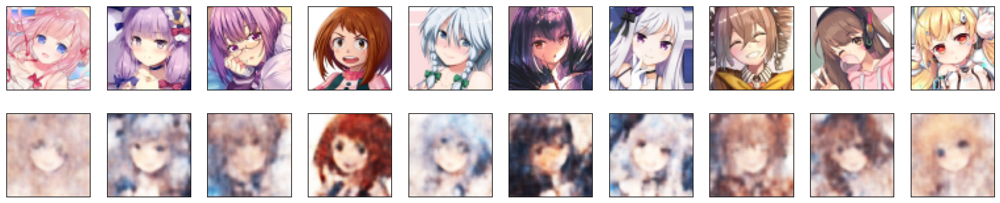

6/6 [==============================] - 2s 336ms/step - loss: 2101.1230
Epoch 321/500
6/6 [==============================] - 1s 95ms/step - loss: 2101.0176
Epoch 322/500
6/6 [==============================] - 1s 96ms/step - loss: 2101.0945
Epoch 323/500
6/6 [==============================] - 1s 96ms/step - loss: 2099.7759
Epoch 324/500
6/6 [==============================] - 1s 96ms/step - loss: 2097.9661
Epoch 325/500
6/6 [==============================] - 1s 96ms/step - loss: 2096.5437
Epoch 326/500
6/6 [==============================] - 1s 95ms/step - loss: 2095.9509
Epoch 327/500
6/6 [==============================] - 1s 97ms/step - loss: 2096.7561
Epoch 328/500
6/6 [==============================] - 1s 97ms/step - loss: 2096.7051
Epoch 329/500
6/6 [==============================] - 1s 95ms/step - loss: 2096.4780
Epoch 330/500
6/6 [==============================] - 1s 97ms/step - loss: 2094.2339
Epoch 331/500
6/6 [==============================] - 1s 96ms/step - loss: 2093.2024
Epoch

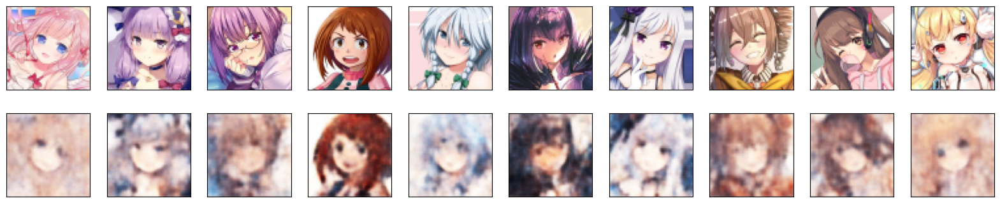

6/6 [==============================] - 2s 384ms/step - loss: 2092.7698
Epoch 341/500
6/6 [==============================] - 1s 98ms/step - loss: 2092.1750
Epoch 342/500
6/6 [==============================] - 1s 98ms/step - loss: 2091.5645
Epoch 343/500
6/6 [==============================] - 1s 97ms/step - loss: 2089.9321
Epoch 344/500
6/6 [==============================] - 1s 95ms/step - loss: 2090.1609
Epoch 345/500
6/6 [==============================] - 1s 96ms/step - loss: 2089.2217
Epoch 346/500
6/6 [==============================] - 1s 96ms/step - loss: 2088.4280
Epoch 347/500
6/6 [==============================] - 1s 96ms/step - loss: 2087.8586
Epoch 348/500
6/6 [==============================] - 1s 96ms/step - loss: 2087.2354
Epoch 349/500
6/6 [==============================] - 1s 96ms/step - loss: 2086.4011
Epoch 350/500
6/6 [==============================] - 1s 97ms/step - loss: 2085.8379
Epoch 351/500
6/6 [==============================] - 1s 95ms/step - loss: 2088.2837
Epoch

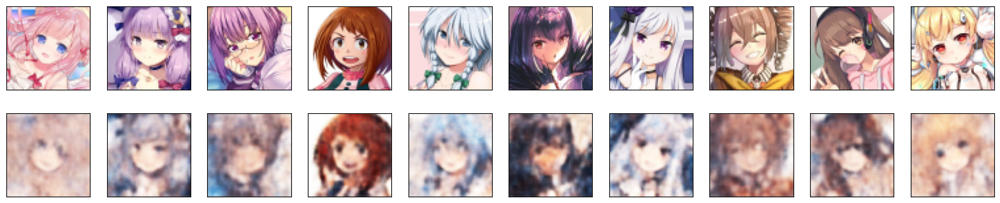

6/6 [==============================] - 2s 340ms/step - loss: 2084.2029
Epoch 361/500
6/6 [==============================] - 1s 96ms/step - loss: 2083.8850
Epoch 362/500
6/6 [==============================] - 1s 98ms/step - loss: 2082.5085
Epoch 363/500
6/6 [==============================] - 1s 96ms/step - loss: 2081.7976
Epoch 364/500
6/6 [==============================] - 1s 96ms/step - loss: 2081.8052
Epoch 365/500
6/6 [==============================] - 1s 96ms/step - loss: 2081.3225
Epoch 366/500
6/6 [==============================] - 1s 97ms/step - loss: 2079.9629
Epoch 367/500
6/6 [==============================] - 1s 95ms/step - loss: 2080.4941
Epoch 368/500
6/6 [==============================] - 1s 96ms/step - loss: 2081.4109
Epoch 369/500
6/6 [==============================] - 1s 96ms/step - loss: 2081.5325
Epoch 370/500
6/6 [==============================] - 1s 96ms/step - loss: 2080.2888
Epoch 371/500
6/6 [==============================] - 1s 95ms/step - loss: 2080.8313
Epoch

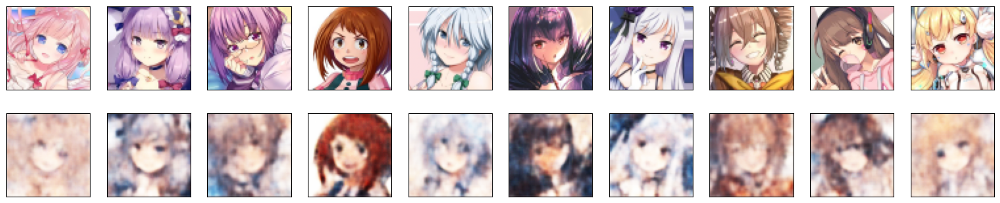

6/6 [==============================] - 2s 332ms/step - loss: 2076.9080
Epoch 381/500
6/6 [==============================] - 1s 96ms/step - loss: 2078.7766
Epoch 382/500
6/6 [==============================] - 1s 96ms/step - loss: 2077.5195
Epoch 383/500
6/6 [==============================] - 1s 96ms/step - loss: 2077.1511
Epoch 384/500
6/6 [==============================] - 1s 96ms/step - loss: 2076.9084
Epoch 385/500
6/6 [==============================] - 1s 96ms/step - loss: 2074.6062
Epoch 386/500
6/6 [==============================] - 1s 95ms/step - loss: 2073.1885
Epoch 387/500
6/6 [==============================] - 1s 96ms/step - loss: 2075.8835
Epoch 388/500
6/6 [==============================] - 1s 96ms/step - loss: 2073.2473
Epoch 389/500
6/6 [==============================] - 1s 96ms/step - loss: 2073.6208
Epoch 390/500
6/6 [==============================] - 1s 97ms/step - loss: 2072.4534
Epoch 391/500
6/6 [==============================] - 1s 96ms/step - loss: 2073.0286
Epoch

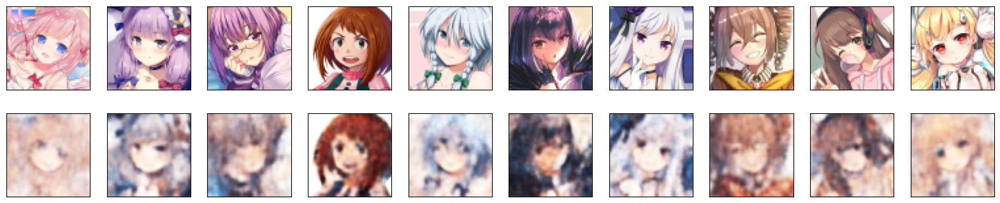

6/6 [==============================] - 2s 388ms/step - loss: 2072.1477
Epoch 401/500
6/6 [==============================] - 1s 94ms/step - loss: 2071.7363
Epoch 402/500
6/6 [==============================] - 1s 97ms/step - loss: 2071.8674
Epoch 403/500
6/6 [==============================] - 1s 95ms/step - loss: 2070.1599
Epoch 404/500
6/6 [==============================] - 1s 96ms/step - loss: 2070.9629
Epoch 405/500
6/6 [==============================] - 1s 96ms/step - loss: 2070.5229
Epoch 406/500
6/6 [==============================] - 1s 97ms/step - loss: 2070.2488
Epoch 407/500
6/6 [==============================] - 1s 96ms/step - loss: 2067.3406
Epoch 408/500
6/6 [==============================] - 1s 96ms/step - loss: 2067.5002
Epoch 409/500
6/6 [==============================] - 1s 96ms/step - loss: 2067.5771
Epoch 410/500
6/6 [==============================] - 1s 95ms/step - loss: 2069.4182
Epoch 411/500
6/6 [==============================] - 1s 97ms/step - loss: 2070.5132
Epoch

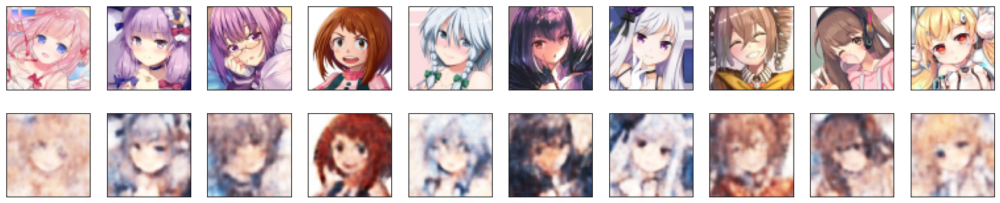

6/6 [==============================] - 2s 338ms/step - loss: 2067.1199
Epoch 421/500
6/6 [==============================] - 1s 96ms/step - loss: 2066.2449
Epoch 422/500
6/6 [==============================] - 1s 96ms/step - loss: 2066.1077
Epoch 423/500
6/6 [==============================] - 1s 95ms/step - loss: 2067.4111
Epoch 424/500
6/6 [==============================] - 1s 96ms/step - loss: 2068.3164
Epoch 425/500
6/6 [==============================] - 1s 95ms/step - loss: 2066.5400
Epoch 426/500
6/6 [==============================] - 1s 98ms/step - loss: 2067.4270
Epoch 427/500
6/6 [==============================] - 1s 96ms/step - loss: 2066.2439
Epoch 428/500
6/6 [==============================] - 1s 96ms/step - loss: 2064.5632
Epoch 429/500
6/6 [==============================] - 1s 97ms/step - loss: 2064.3577
Epoch 430/500
6/6 [==============================] - 1s 96ms/step - loss: 2067.2239
Epoch 431/500
6/6 [==============================] - 1s 97ms/step - loss: 2068.8503
Epoch

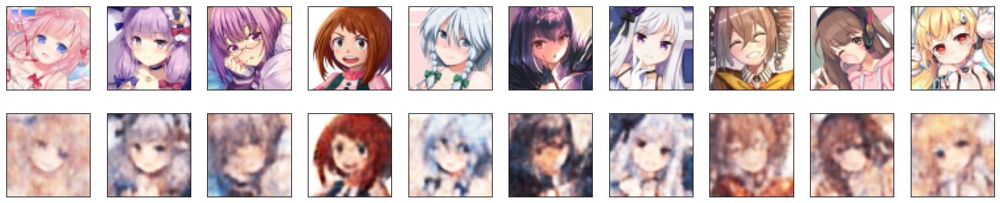

6/6 [==============================] - 2s 335ms/step - loss: 2063.6887
Epoch 441/500
6/6 [==============================] - 1s 95ms/step - loss: 2063.2249
Epoch 442/500
6/6 [==============================] - 1s 97ms/step - loss: 2064.1912
Epoch 443/500
6/6 [==============================] - 1s 95ms/step - loss: 2062.3665
Epoch 444/500
6/6 [==============================] - 1s 96ms/step - loss: 2061.3843
Epoch 445/500
6/6 [==============================] - 1s 96ms/step - loss: 2061.3374
Epoch 446/500
6/6 [==============================] - 1s 96ms/step - loss: 2060.9919
Epoch 447/500
6/6 [==============================] - 1s 96ms/step - loss: 2061.6160
Epoch 448/500
6/6 [==============================] - 1s 96ms/step - loss: 2061.0798
Epoch 449/500
6/6 [==============================] - 1s 95ms/step - loss: 2061.1375
Epoch 450/500
6/6 [==============================] - 1s 98ms/step - loss: 2059.2839
Epoch 451/500
6/6 [==============================] - 1s 95ms/step - loss: 2063.6687
Epoch

In [ ]:
epochs = 500
batch_size = 256
vae.fit(x_data, x_data, epochs=epochs, batch_size=batch_size,callbacks=[plot_callback])

In [ ]:
decoder.save('/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/decoder_model_April16.h5')

43/43 [==============================] - 0s 2ms/step


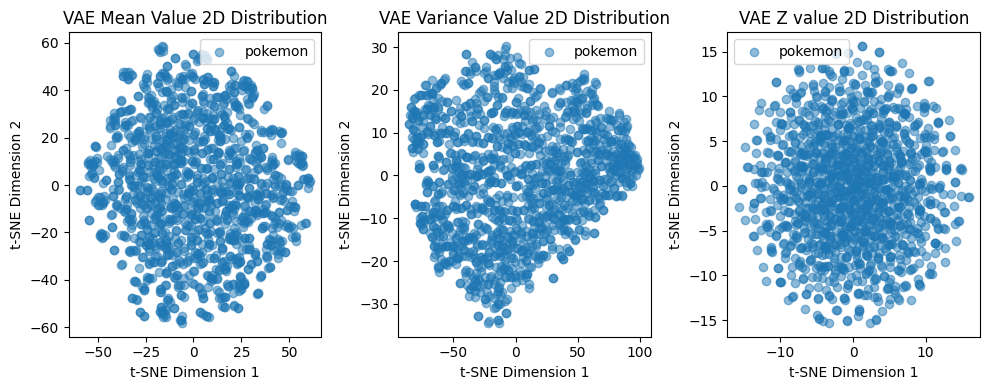

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

z_mean, z_log_var, z = encoder.predict(x_data)

# Perform t-SNE dimensionality reduction
z_mean_2d = TSNE(n_components=2).fit_transform(z_mean)
z_log_var_2d = TSNE(n_components=2).fit_transform(z_log_var)
z_2d = TSNE(n_components=2).fit_transform(z)

# Plot the 2D distribution of the latent space
fig, axs = plt.subplots(1, 3, figsize=(10, 4))

axs[0].scatter(z_mean_2d[:, 0], z_mean_2d[:, 1], alpha=0.5, label = "pokemon")
axs[0].set_title("VAE Mean Value 2D Distribution")
axs[0].set_xlabel("t-SNE Dimension 1")
axs[0].set_ylabel("t-SNE Dimension 2")
axs[0].legend()

axs[1].scatter(z_log_var_2d[:, 0], z_log_var_2d[:, 1], alpha=0.5,  label = "pokemon")
axs[1].set_title("VAE Variance Value 2D Distribution")
axs[1].set_xlabel("t-SNE Dimension 1")
axs[1].set_ylabel("t-SNE Dimension 2")
axs[1].legend()

axs[2].scatter(z_2d[:, 0], z_2d[:, 1], alpha=0.5, label = "pokemon")
axs[2].set_title("VAE Z value 2D Distribution")
axs[2].set_xlabel("t-SNE Dimension 1")
axs[2].set_ylabel("t-SNE Dimension 2")
axs[2].legend()

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 115ms/step


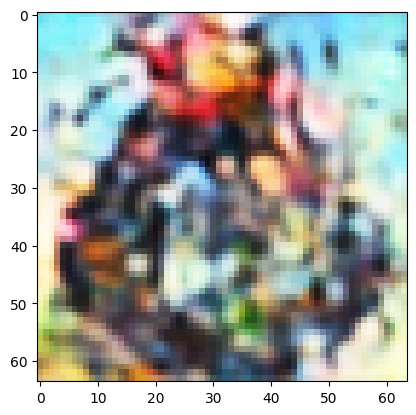

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the decoder model
decoder = load_model('/content/drive/My Drive/2023_spring/DS340/DS340_GroupProject/decoder_model_April16.h5')

# Sampling function
def sampling(z_mean, z_log_var):
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], LATENT_DIM), dtype=tf.double)
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# Generate a random z_mean and z_log_var for demonstration
z_mean_example = np.random.normal(0, 1, (5, LATENT_DIM))
z_log_var_example = np.random.normal(0, 1, (5, LATENT_DIM))

# Obtain a sample from the latent space
z_sample = sampling(z_mean_example, z_log_var_example)

# Generate an image using the decoder
generated_image = decoder.predict(z_sample)

# Display the generated image
plt.imshow(generated_image[4])
plt.show()

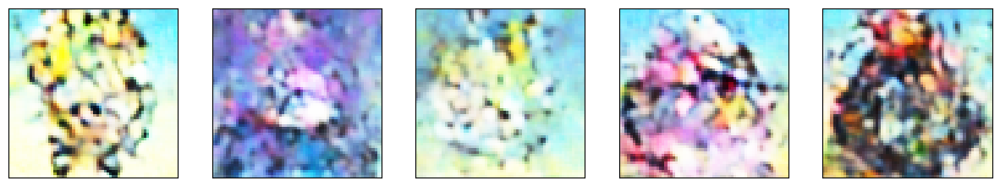

In [ ]:
n = 5

fig = plt.figure(figsize=(n * 3, 3))  # Set the figure size (optional)

for i in range(n):
    ax = plt.subplot(1, n, i + 1)  # Set 1 row and n columns
    plt.imshow(generated_image[i])
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.layers import InputLayer, Lambda, Dense

NOISE_DIM = 1

def sampling(args):
    z_mean, z_log_var = args
    print(z_mean.shape)
    print(z_log_var.shape)
    batch_size = tf.shape(z_mean)[0]
    epsilon = tf.keras.backend.random_normal(shape=(batch_size, LATENT_DIM))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

def generator(decoder, noise_dim=NOISE_DIM):
    # Freeze layers in the saved model
    for i, layer in enumerate(decoder.layers):
        layer.trainable = False
        layer._name = f'saved_model_{i}_{layer.name}'

    model = Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        InputLayer(input_shape=(noise_dim,)),
        Dense(16, activation='relu'),
        Dense(64, activation='relu'),
        Dense(128, activation='relu'),
        Dense(256, activation='relu'),
        Dense(256 * 2),  # Output both z_mean_example and z_log_var_example
        Lambda(lambda x: sampling([x[:, :256], x[:, 256:]])),  # Apply the sampling function
    ])

    # Add layers from the saved model
    for layer in decoder.layers:
        model.add(layer)

    # Add additional layers if needed
    # model.add(tf.keras.layers.Dense(...))
    # model.add(tf.keras.layers.ReLU(...))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return model

gen_model = generator(decoder)

(None, 256)
(None, 256)


(None, 256)
(None, 256)
1/1 [==============================] - 0s 203ms/step


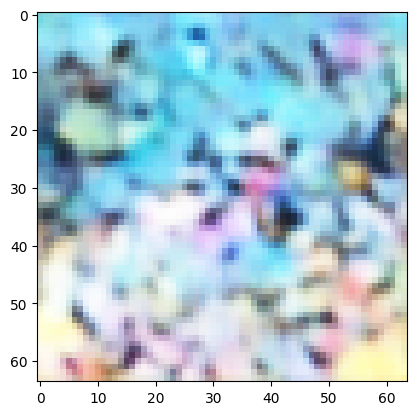

In [ ]:
noise_example = np.random.randn(1, NOISE_DIM)
output = gen_model.predict(noise_example)

plt.imshow(output[0])
plt.show()